In [1]:
import geopandas
import matplotlib.pyplot as plt
import pandas as pd

from pathlib import Path

In [2]:
path = geopandas.datasets.get_path('naturalearth_lowres')
world_df = geopandas.read_file(path)

/var/folders/k_/5472klmd4fdb_wdkwgm7_n8m0000gp/T/ipykernel_86566/623800688.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  path = geopandas.datasets.get_path('naturalearth_lowres')


In [3]:
data_dp = Path("../data/")

# Get people information

In [4]:
people_df = pd.read_csv(data_dp / Path("people.csv"), index_col=0)

In [5]:
people_df

,city,country,first-name,last-name,pronouns,country-alpha_3,continent,longitude,latitude,ols-1-role,...,ols-6-facilitator,ols-6-organizer,ols-7-role,ols-7-participant,ols-7-mentor,ols-7-expert,ols-7-speaker,ols-7-facilitator,ols-7-organizer,mastodon
0sahene,Tamale,Ghana,Sitsofe,Morgah,He,GHA,Africa,-0.842399,9.405199,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0x174,Boston,United States,William,Jackson,He/Him,USA,North America,-71.060511,42.355433,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4iro,"Rancagua, Provincia De Buenos Aires",Argentina,Irene,Vazano,She/her/hers,ARG,South America,-60.504583,-34.029963,NaN,...,NaN,NaN,participant,"Mapping open-science communities, organization...",NaN,NaN,NaN,NaN,NaN,NaN
abdulelahsm,Dammam,Saudi Arabia,Abdulelah,Al Mesfer,he/him,SAU,Asia,50.103999,26.436782,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
abraham-dabengwa,Johannesburg,South Africa,Abraham,Dabengwa,he/ him,ZAF,Africa,28.049722,-26.205000,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
rhoné-roux,NaN,NaN,Rhoné,Roux,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sgsfak,NaN,NaN,Stelios,Sfakianakis,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tallmar,NaN,NaN,Marta,Lloret Llinares,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
umar-farouk-ahmad,NaN,NaN,Umar Farouk,Ahmad,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
cohort_nb = 8

In [7]:
roles_dp = data_dp / Path('roles')
roles_df = {}
roles = []
for r in roles_dp.iterdir():
    role = r.stem
    roles.append(role)
    roles_df[role] = pd.read_csv(r, index_col=0)

# Countries

Proportion of people without country information

In [8]:
people_df.country.isna().sum() / len(people_df.country)

0.047520661157024795

## Country repartition

In [9]:
countries_df = {}
countries_perc_df = {}
for r in roles: 
    countries_df[r] = (roles_df[r].groupby(['country']).count()
        .rename(columns = {'country-alpha_3': 'total'})
        .drop(columns = ['city','first-name','last-name','pronouns','continent','longitude','latitude']))
    countries_perc_df[r] = 100 * countries_df[r] / countries_df[r].sum(axis = 0)

In [10]:
countries_df['role']

,total,ols-1,ols-2,ols-3,ols-4,ols-5,ols-6,ols-7
country,,,,,,,,
Argentina,18,0,2,2,4,8,3,8
Australia,8,1,5,4,2,1,1,1
Austria,1,0,1,0,0,0,0,0
Bangladesh,1,0,1,0,0,0,0,0
Belgium,2,0,0,2,0,0,0,0
Benin,1,0,0,0,0,1,0,0
Bolivia,0,0,0,0,0,5,0,0
Brazil,14,4,4,2,1,2,4,4
Cameroon,9,0,0,0,0,2,2,9


In [11]:
countries_perc_df['role']

,total,ols-1,ols-2,ols-3,ols-4,ols-5,ols-6,ols-7
country,,,,,,,,
Argentina,4.072398,0.000000,1.470588,1.470588,4.040404,6.060606,3.092784,9.090909
Australia,1.809955,1.282051,3.676471,2.941176,2.020202,0.757576,1.030928,1.136364
Austria,0.226244,0.000000,0.735294,0.000000,0.000000,0.000000,0.000000,0.000000
Bangladesh,0.226244,0.000000,0.735294,0.000000,0.000000,0.000000,0.000000,0.000000
Belgium,0.452489,0.000000,0.000000,1.470588,0.000000,0.000000,0.000000,0.000000
Benin,0.226244,0.000000,0.000000,0.000000,0.000000,0.757576,0.000000,0.000000
Bolivia,0.000000,0.000000,0.000000,0.000000,0.000000,3.787879,0.000000,0.000000
Brazil,3.167421,5.128205,2.941176,1.470588,1.010101,1.515152,4.123711,4.545455
Cameroon,2.036199,0.000000,0.000000,0.000000,0.000000,1.515152,2.061856,10.227273


## Maps

In [12]:
country_code_df = {}
country_world_df = {}
for r in roles: 
    country_code_df[r] = (roles_df[r].groupby(['country-alpha_3']).count()
        .rename(columns = {'country': 'total'})
        .drop(columns = ['city','first-name','last-name','pronouns','continent','longitude','latitude'])
        )
    country_code_df[r] = 100 * country_code_df[r] / country_code_df[r].sum(axis = 0)
    country_code_df[r] = (country_code_df[r]
        .rename_axis("iso_a3")
        .reset_index())
    
    country_world_df[r] = pd.merge(world_df, country_code_df[r], on='iso_a3', how='outer')
    country_world_df[r]['total'].fillna(0, inplace=True)
    for i in range(1, cohort_nb):
        country_world_df[r][f'ols-{i}'].fillna(0, inplace=True)
    country_world_df[r].head()

/var/folders/k_/5472klmd4fdb_wdkwgm7_n8m0000gp/T/ipykernel_86566/1222888852.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(15, 10))


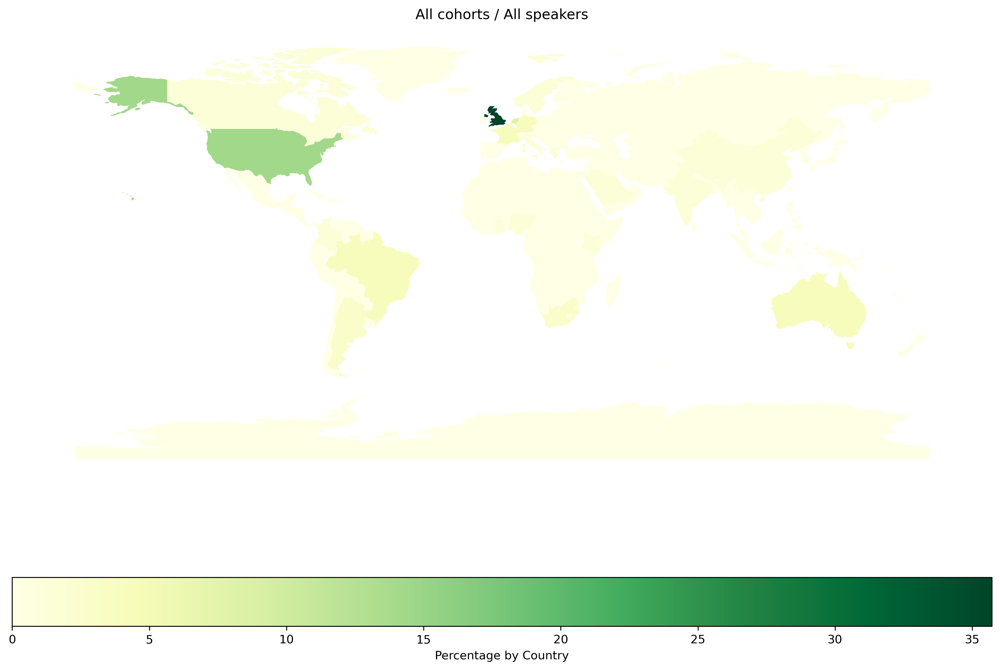

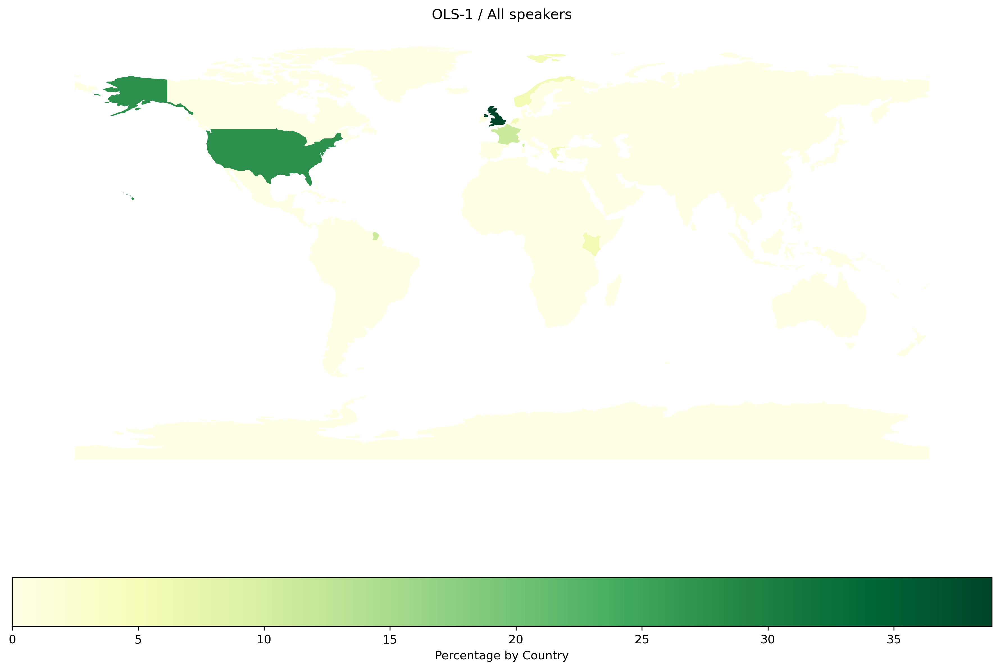

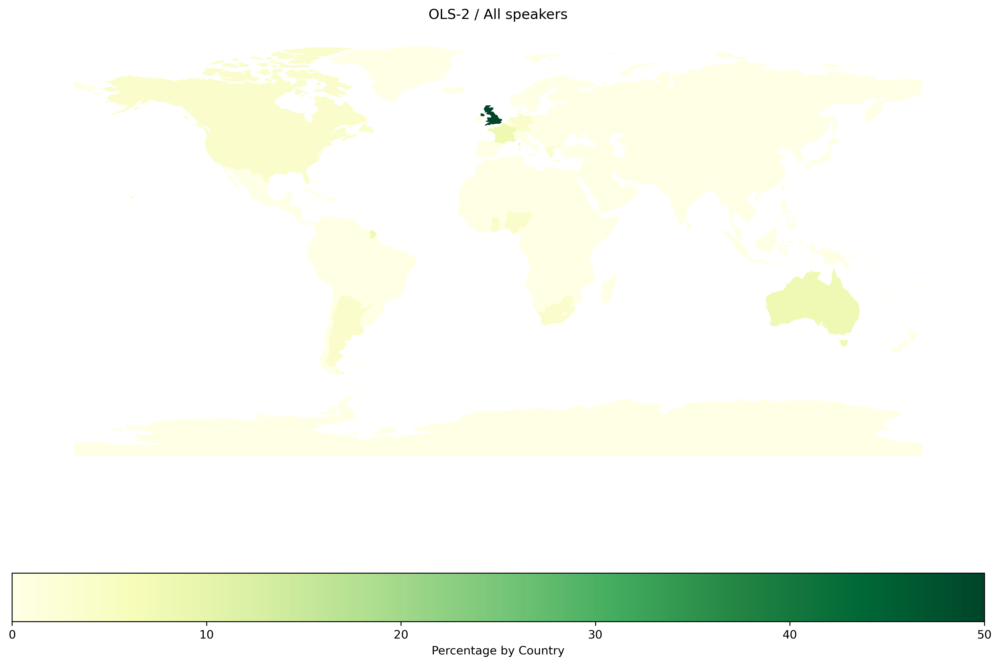

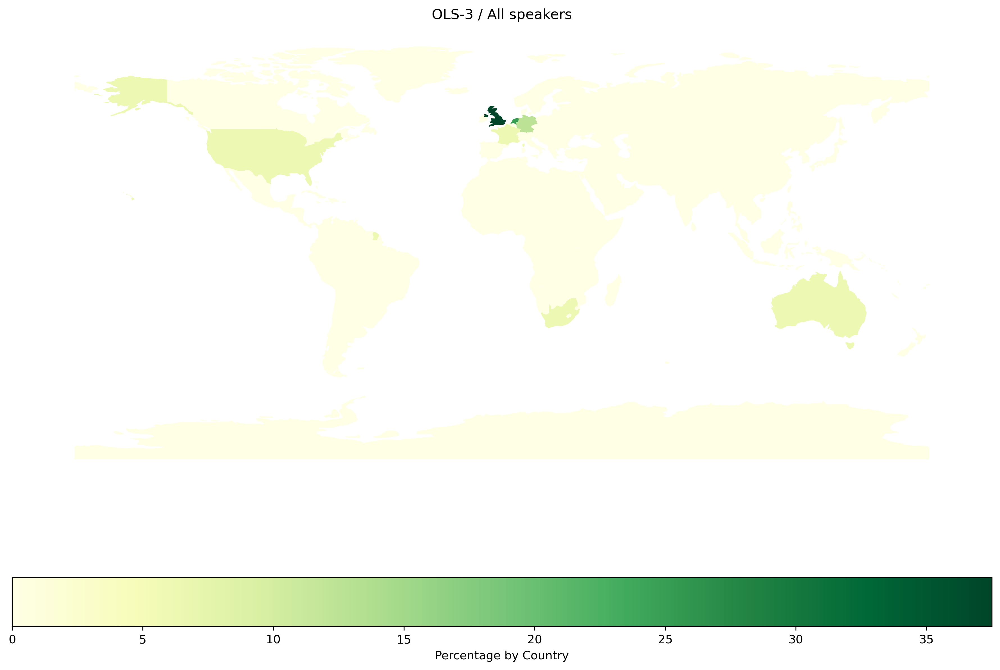

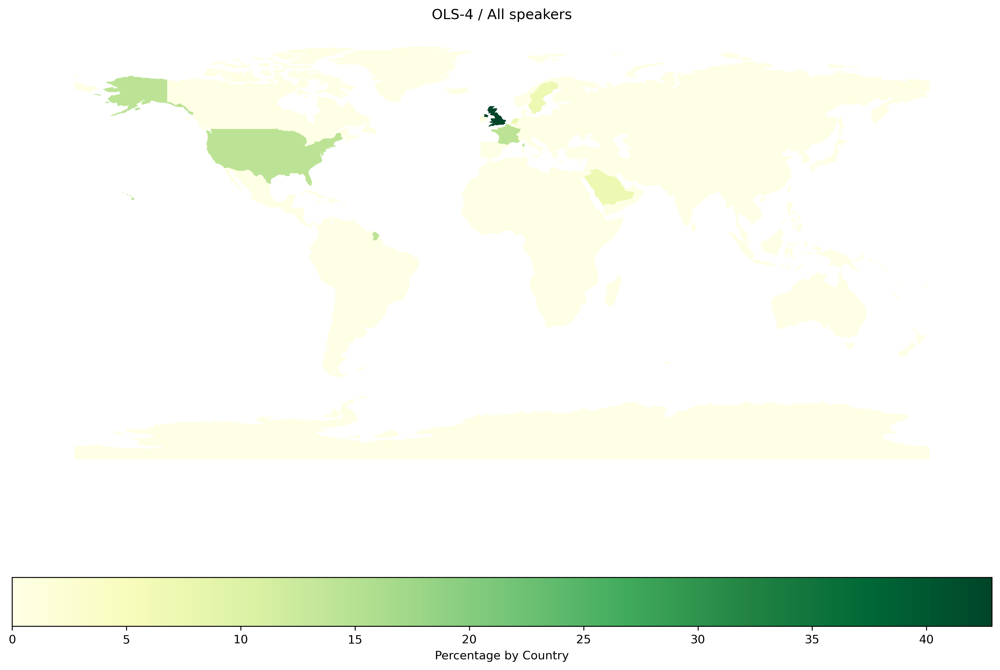

...

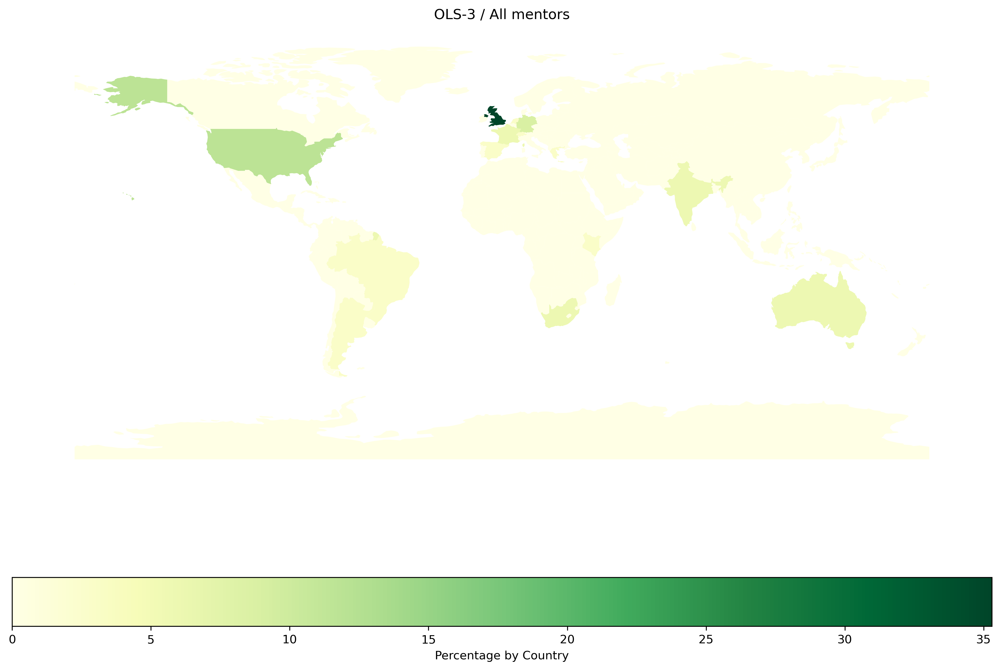

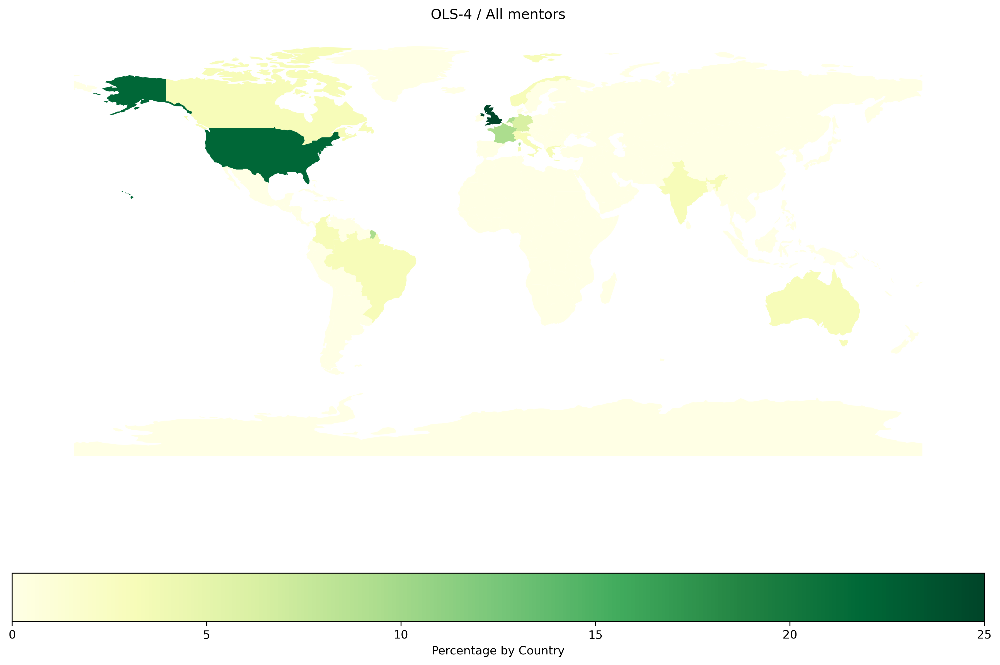

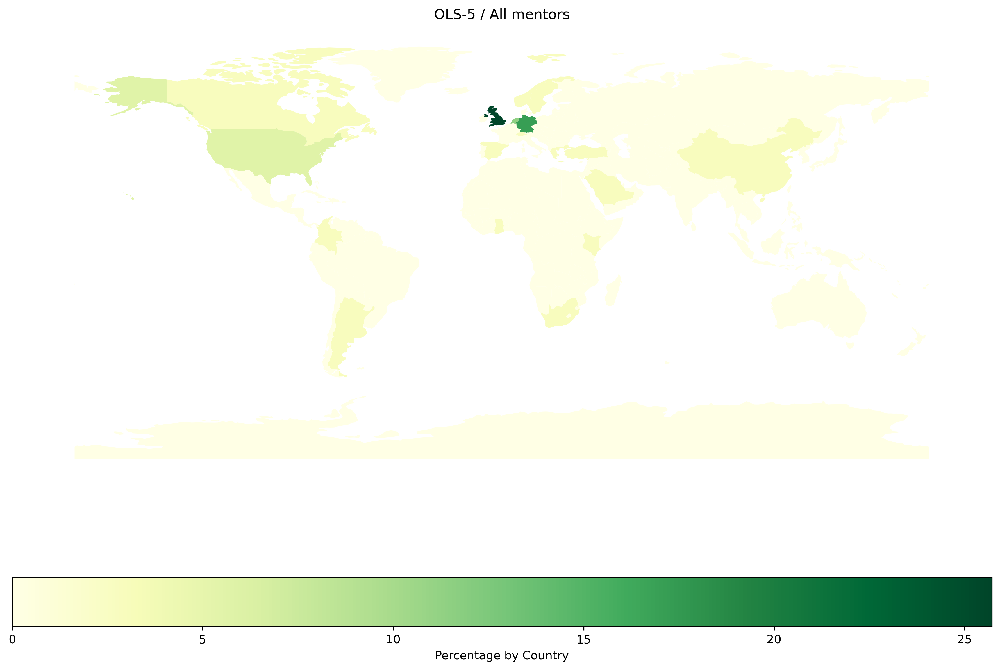

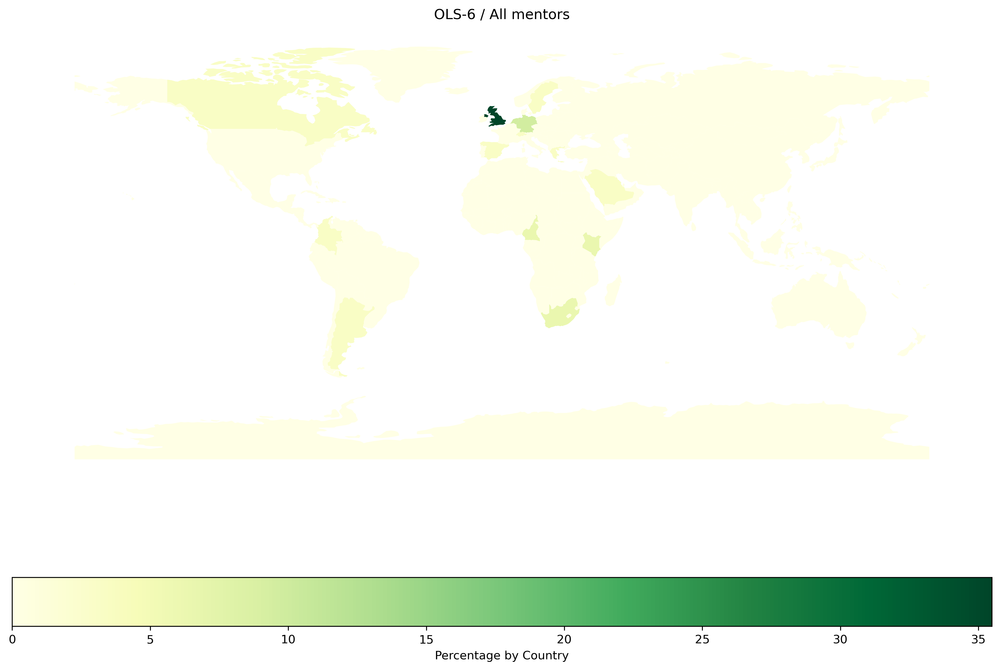

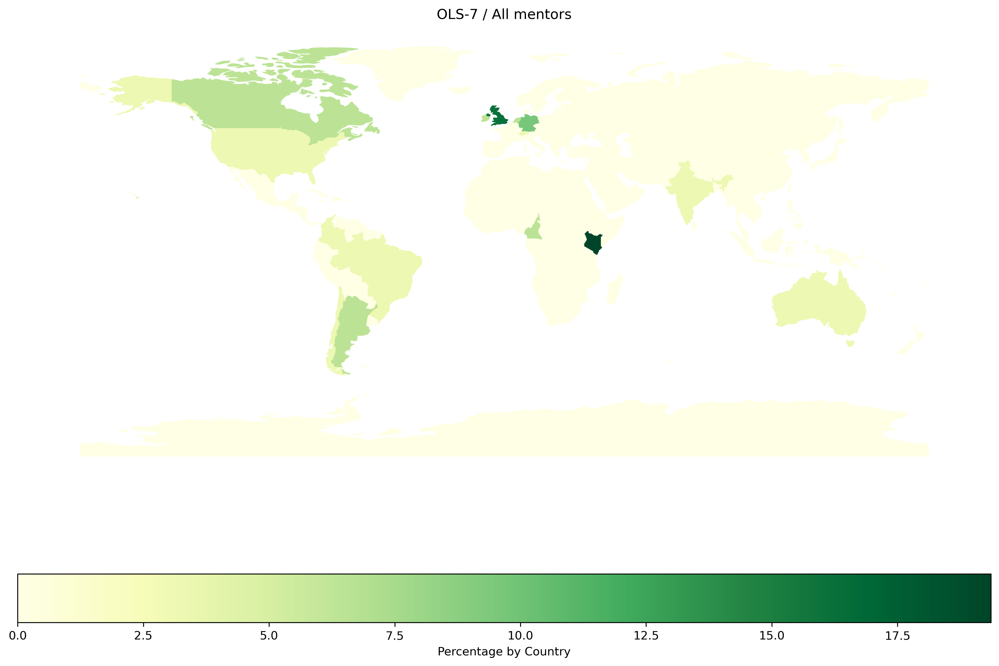

In [21]:
for r in roles: 
    fig, ax = plt.subplots(figsize=(15, 10))
    fig.set_dpi(300)
    
    country_world_df[r].plot(
        column='total',
        ax=ax,
        legend=True,
        legend_kwds={'label': "Percentage by Country", 'orientation': "horizontal"},
        cmap='YlGn')
    plt.title(f'All cohorts / All {r}s')
    ax.set_axis_off()
        
    plt.savefig(f'../results/location/{r}-all-cohorts.png', bbox_inches='tight')
    
    for i in range(1,cohort_nb):
        fig, ax = plt.subplots(figsize=(15, 10))
        fig.set_dpi(300)

        country_world_df[r].plot(
            column=f'ols-{i}',
            ax=ax,
            legend=True,
            missing_kwds={"color": "lightgrey"},
            legend_kwds={'label': "Percentage by Country", 'orientation': "horizontal"},
            cmap='YlGn')
        plt.title(f'OLS-{i} / All {r}s')
        ax.set_axis_off()
        
        plt.savefig(f'../results/location/{r}-ols-{i}.png', bbox_inches='tight')

# Continents

Proportion of people without continent information

In [ ]:
people_df.continent.isna().sum() / len(people_df.continent)

## Continent repartition for all roles

In [ ]:
continents_df = {}
continents_perc_df = {}
for r in roles: 
    continents_df[r] = (roles_df[r].groupby(['continent']).count()
        .rename(columns = {'country-alpha_3': 'total'})
        .drop(columns = ['city','first-name','last-name','pronouns','country','longitude','latitude']))
    continents_perc_df[r] = 100 * continents_df[r] / continents_df[r].sum(axis = 0)


In [ ]:
continents_df['role']

In [ ]:
continents_perc_df['role']

In [ ]:
for r in roles: 
    fig, ax = plt.subplots()
    fig.set_dpi(300)
    (continents_perc_df[r]
         .drop(columns=['total'])
         .transpose()
         .plot(ax=ax, colormap='tab20c'))
    plt.title(f'All {r}s')
    plt.xlabel('Cohorts')
    plt.ylabel(f'{r} (%)')
    ax.legend(
        loc='center left',
        bbox_to_anchor=(1, 0.5),
        frameon=False,
        fontsize='x-small')
    
    fig, ax = plt.subplots()
    fig.set_dpi(300)
    (continents_perc_df[r]
         .drop(columns=['total'])
         .transpose()
         .plot.bar(stacked=True, ax=ax, colormap='tab20c'))
    plt.title(f'All {r}s')
    plt.xlabel('Cohorts')
    plt.ylabel(f'{r} (%)')
    ax.legend(
        loc='center left',
        bbox_to_anchor=(1, 0.5),
        frameon=False,
        fontsize='x-small')